In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from scipy import stats
from sklearn.preprocessing import StandardScaler
import matplotlib.dates as mdates
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.metrics import dtw
from keras.preprocessing.sequence import pad_sequences

In [4]:
wearable_data = pd.read_csv("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/werable_data(in).csv")

In [5]:
wearable_data

,patient_id,pr_display,spo2_display,resp_display,pulse_rate_obscount,pulse_rate_avg,pulse_rate_min,pulse_rate_max,pulse_rate_iqr,spo2_obscount,...,weight_obscount,weight_avg,weight_min,weight_max,motion_obscount,motion_avg,step_count_sum,step_count_obscount,date,time
0,WEAR_7025,--,--,--,2.0,180.52,177.05,184.00,6.95,NaN,...,NaN,NaN,NaN,NaN,3.0,1.00,0.0,2.0,8/8/2023,17:26:00
1,WEAR_7025,--,--,--,2.0,200.71,196.79,204.63,7.84,NaN,...,NaN,NaN,NaN,NaN,8.0,6.13,0.0,2.0,8/8/2023,17:27:00
2,WEAR_7025,--,--,--,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.0,9.81,0.0,2.0,8/8/2023,17:28:00
3,WEAR_7025,--,--,--,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.0,9.56,0.0,2.0,8/8/2023,17:29:00
4,WEAR_7025,--,--,--,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,16.0,10.00,0.0,2.0,8/8/2023,17:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331259,WEAR_7003,66 beats/min,99%,16%,30.0,65.88,64.50,67.78,1.75,21.0,...,NaN,NaN,NaN,NaN,16.0,2.00,0.0,2.0,11/23/2022,9:26:00
331260,WEAR_7003,66 beats/min,99%,16-22%,23.0,65.70,64.15,68.00,1.95,13.0,...,NaN,NaN,NaN,NaN,16.0,2.06,0.0,2.0,11/23/2022,9:27:00
331261,WEAR_7003,--,99%,12%,8.0,65.39,64.60,67.87,0.60,7.0,...,NaN,NaN,NaN,NaN,16.0,4.44,0.0,2.0,11/23/2022,9:28:00
331262,WEAR_7003,67 beats/min,95%,16-23%,16.0,67.01,63.30,69.95,3.81,11.0,...,NaN,NaN,NaN,NaN,16.0,1.81,0.0,2.0,11/23/2022,9:29:00


In [140]:
wearable_data.replace('--', np.nan, inplace=True)

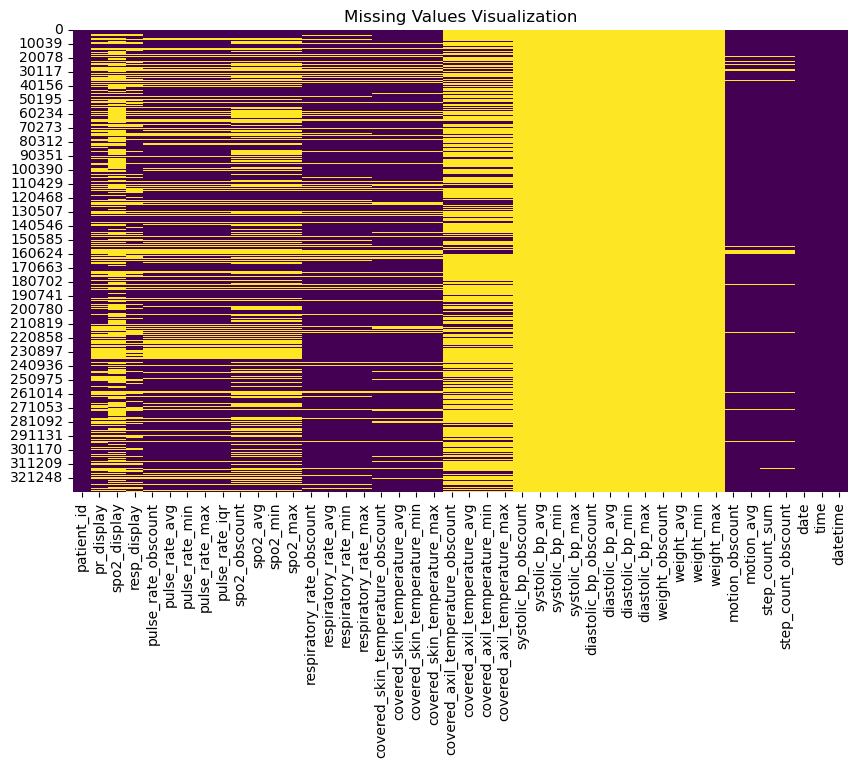

In [141]:
plt.figure(figsize=(10, 6))
sns.heatmap(wearable_data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()

In [142]:
wearable_data.isna().sum()

patient_id                                0
pr_display                           137063
spo2_display                         207480
resp_display                         117937
pulse_rate_obscount                   88109
pulse_rate_avg                        88109
pulse_rate_min                        88109
pulse_rate_max                        88109
pulse_rate_iqr                        88109
spo2_obscount                        148503
spo2_avg                             148503
spo2_min                             148503
spo2_max                             148503
respiratory_rate_obscount             57838
respiratory_rate_avg                  57838
respiratory_rate_min                  57838
respiratory_rate_max                  57838
covered_skin_temperature_obscount     59633
covered_skin_temperature_avg          59633
covered_skin_temperature_min          59633
covered_skin_temperature_max          59633
covered_axil_temperature_obscount    237859
covered_axil_temperature_avg    

In [143]:
wearable_data['patient_id'].nunique()

29

In [144]:
import pandas as pd

# Assuming your DataFrame is called `df` and has 'patient_id', 'date', and 'time' columns

# Combine 'date' and 'time' columns to create a datetime column
wearable_data['datetime'] = pd.to_datetime(wearable_data['date'] + ' ' + wearable_data['time'])

# Check if data is sorted within each patient by time
sorted_check = wearable_data.groupby('patient_id')['datetime'].apply(lambda x: x.is_monotonic_increasing)

# Print the results
if sorted_check.all():
    print("Data is sorted by time within each patient.")
else:
    print("Data is NOT sorted by time within each patient.")
    print("Patients with unsorted data:", sorted_check[~sorted_check].index.tolist())


Data is sorted by time within each patient.


In [145]:
import pandas as pd

# Assuming your data is loaded into a DataFrame called `df`
# Ensure your data is sorted by time or any relevant sequential feature

# Apply interpolation across all columns

df_interpolated = wearable_data.groupby('patient_id').apply(lambda group: group.interpolate(method='linear'))
df_interpolated.reset_index(drop=True, inplace=True)

# If you only want to interpolate specific columns, you can specify them like this:
# df_interpolated[['column1', 'column2']] = df.groupby('patient_id')[['column1', 'column2']].apply(lambda group: group.interpolate(method='linear'))

# Alternatively, you can use 'time' as the interpolation method if it is a time-indexed DataFrame
# df_interpolated = df.groupby('patient_id').apply(lambda group: group.interpolate(method='time'))

# Checking if any missing values remain
print(df_interpolated.isnull().sum())


patient_id                                0
pr_display                           137063
spo2_display                         207480
resp_display                         117937
pulse_rate_obscount                     306
pulse_rate_avg                          306
pulse_rate_min                          306
pulse_rate_max                          306
pulse_rate_iqr                          306
spo2_obscount                           469
spo2_avg                                469
spo2_min                                469
spo2_max                                469
respiratory_rate_obscount                33
respiratory_rate_avg                     33
respiratory_rate_min                     33
respiratory_rate_max                     33
covered_skin_temperature_obscount        22
covered_skin_temperature_avg             22
covered_skin_temperature_min             22
covered_skin_temperature_max             22
covered_axil_temperature_obscount      6854
covered_axil_temperature_avg    

In [146]:
columns_to_remove = ['systolic_bp_obscount', 'systolic_bp_avg', 'systolic_bp_min', 'systolic_bp_max', 'diastolic_bp_obscount', 'diastolic_bp_avg','diastolic_bp_min', 'diastolic_bp_max', 'weight_obscount', 'weight_avg', 'weight_min', 'weight_max']
df_missing_columns_removed = df_interpolated.drop(columns=columns_to_remove,axis=0)

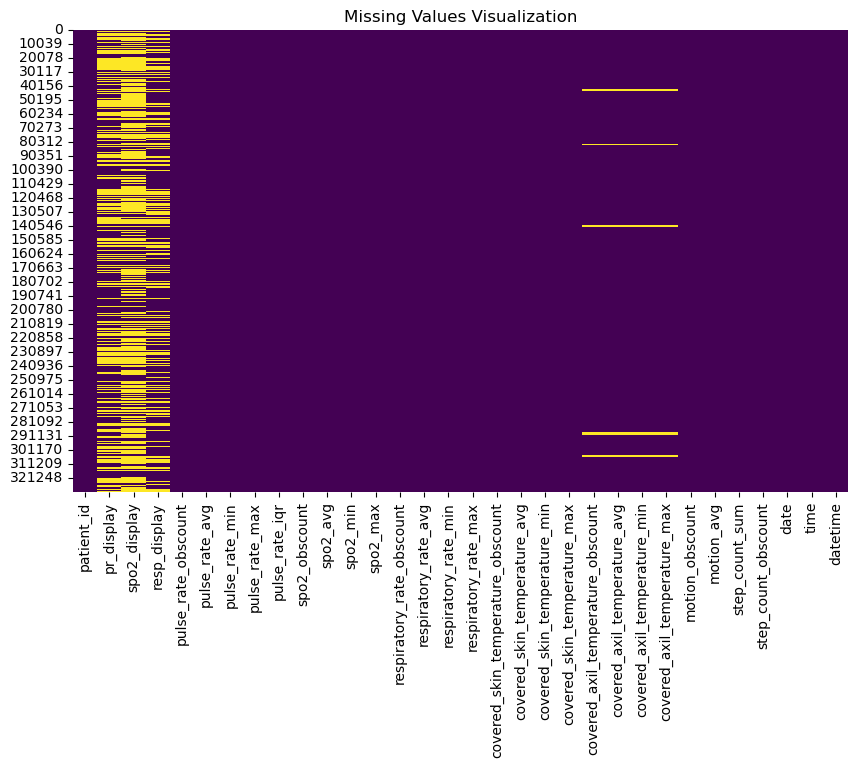

patient_id                                0
pr_display                           137063
spo2_display                         207480
resp_display                         117937
pulse_rate_obscount                     306
pulse_rate_avg                          306
pulse_rate_min                          306
pulse_rate_max                          306
pulse_rate_iqr                          306
spo2_obscount                           469
spo2_avg                                469
spo2_min                                469
spo2_max                                469
respiratory_rate_obscount                33
respiratory_rate_avg                     33
respiratory_rate_min                     33
respiratory_rate_max                     33
covered_skin_temperature_obscount        22
covered_skin_temperature_avg             22
covered_skin_temperature_min             22
covered_skin_temperature_max             22
covered_axil_temperature_obscount      6854
covered_axil_temperature_avg    

In [147]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_missing_columns_removed.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()
print(df_missing_columns_removed.isnull().sum())

In [148]:
## Forward & backward fill
# Forward fill and backward fill within each patient group
df_filled = df_missing_columns_removed.groupby('patient_id').apply(lambda group: group.ffill().bfill())

# Remove the additional index introduced by groupby
df_filled.reset_index(drop=True, inplace=True)

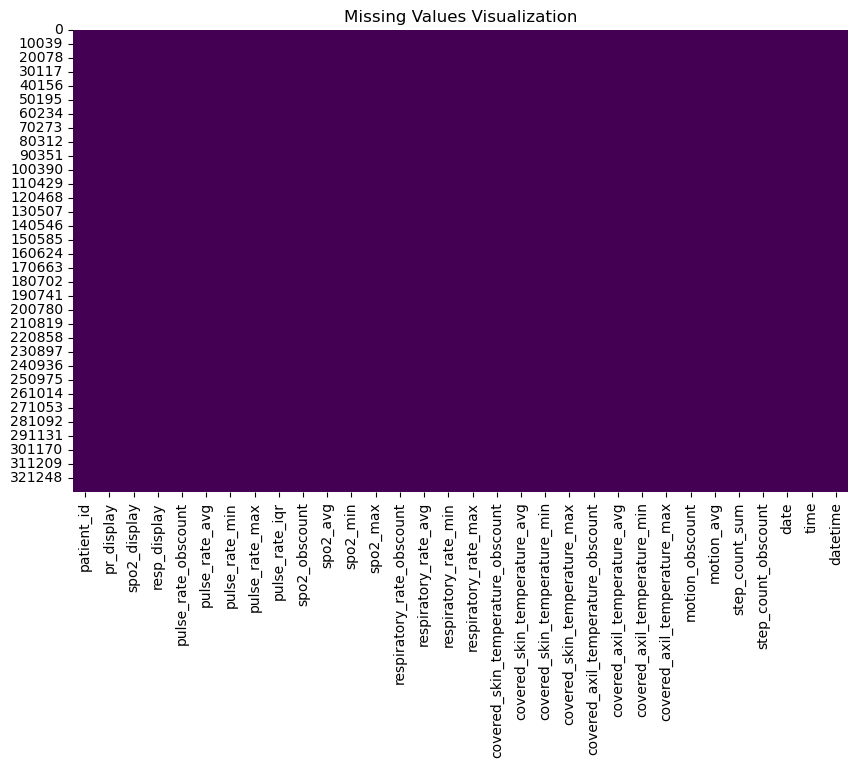

patient_id                             0
pr_display                             0
spo2_display                           0
resp_display                           0
pulse_rate_obscount                    0
pulse_rate_avg                         0
pulse_rate_min                         0
pulse_rate_max                         0
pulse_rate_iqr                         0
spo2_obscount                          0
spo2_avg                               0
spo2_min                               0
spo2_max                               0
respiratory_rate_obscount              0
respiratory_rate_avg                   0
respiratory_rate_min                   0
respiratory_rate_max                   0
covered_skin_temperature_obscount      0
covered_skin_temperature_avg           0
covered_skin_temperature_min           0
covered_skin_temperature_max           0
covered_axil_temperature_obscount    158
covered_axil_temperature_avg         158
covered_axil_temperature_min         158
covered_axil_tem

In [149]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_filled.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()
print(df_filled.isnull().sum())

In [151]:
# For the rest of missing values, it is because that patient 7026 has no values at all on these columns, so we just fill it with mean values
# Impute missing values in each column with the overall mean
df_filled['covered_axil_temperature_obscount'].fillna(df_filled['covered_axil_temperature_obscount'].mean(), inplace=True)
df_filled['covered_axil_temperature_avg'].fillna(df_filled['covered_axil_temperature_avg'].mean(), inplace=True)
df_filled['covered_axil_temperature_min'].fillna(df_filled['covered_axil_temperature_min'].mean(), inplace=True)
df_filled['covered_axil_temperature_max'].fillna(df_filled['covered_axil_temperature_max'].mean(), inplace=True)


In [152]:
df_filled.head()

,patient_id,pr_display,spo2_display,resp_display,pulse_rate_obscount,pulse_rate_avg,pulse_rate_min,pulse_rate_max,pulse_rate_iqr,spo2_obscount,...,covered_axil_temperature_avg,covered_axil_temperature_min,covered_axil_temperature_max,motion_obscount,motion_avg,step_count_sum,step_count_obscount,date,time,datetime
0,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,33.15,33.15,33.15,14.0,1.00,0.0,2.0,10/21/2022,16:02:00,2022-10-21 16:02:00
1,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,33.15,33.15,33.15,2.0,1.00,0.0,1.5,10/21/2022,16:03:00,2022-10-21 16:03:00
2,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,33.15,33.15,33.15,4.0,1.00,0.0,1.0,10/21/2022,17:42:00,2022-10-21 17:42:00
3,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,33.15,33.15,33.15,12.0,1.00,0.0,1.0,10/21/2022,17:43:00,2022-10-21 17:43:00
4,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,33.15,33.15,33.15,7.0,4.86,0.0,2.0,10/21/2022,18:26:00,2022-10-21 18:26:00


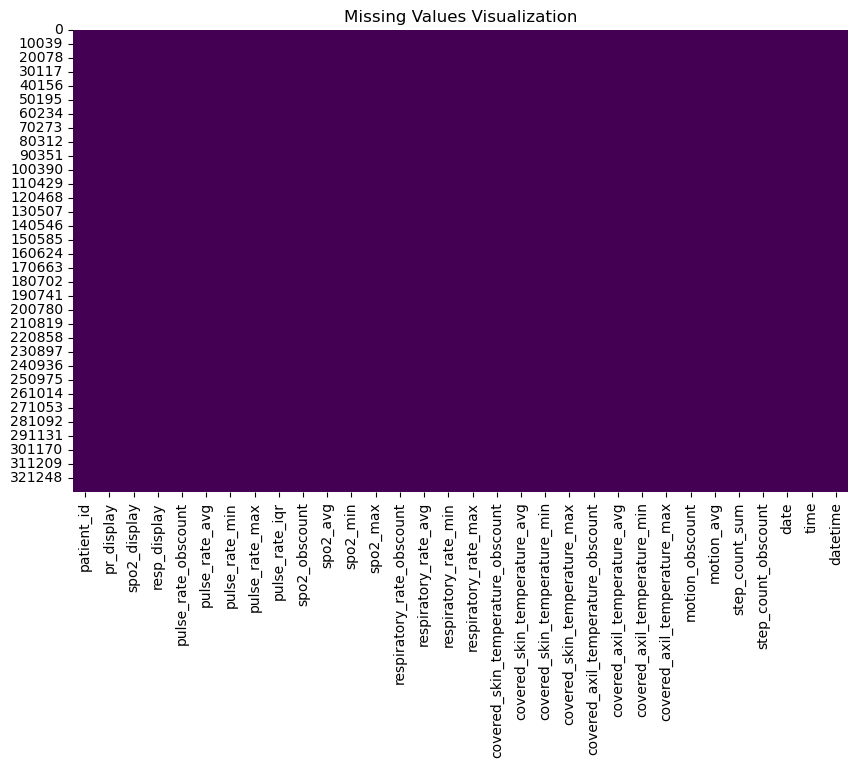

patient_id                           0
pr_display                           0
spo2_display                         0
resp_display                         0
pulse_rate_obscount                  0
pulse_rate_avg                       0
pulse_rate_min                       0
pulse_rate_max                       0
pulse_rate_iqr                       0
spo2_obscount                        0
spo2_avg                             0
spo2_min                             0
spo2_max                             0
respiratory_rate_obscount            0
respiratory_rate_avg                 0
respiratory_rate_min                 0
respiratory_rate_max                 0
covered_skin_temperature_obscount    0
covered_skin_temperature_avg         0
covered_skin_temperature_min         0
covered_skin_temperature_max         0
covered_axil_temperature_obscount    0
covered_axil_temperature_avg         0
covered_axil_temperature_min         0
covered_axil_temperature_max         0
motion_obscount          

In [153]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_filled.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()
print(df_filled.isnull().sum())

In [154]:
df_wearable = df_filled

In [88]:
data_wear_01_15 = pd.read_excel("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/Annotated_WEAR_7001_7015_deID.xlsx", header = 7)
data_wear_16_30 = pd.read_excel("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/Annotated_WEAR_7016_7030_deID.xlsx", header = 7)
# Get rid of normalization summarized rows

data_wear_01_15_remove_normalized = data_wear_01_15.dropna(subset = ['PT_ID'])
data_wear_16_30_remove_normalized = data_wear_16_30.dropna(subset = ['PT_ID'])


In [89]:
#renaming columns to match different data sets
data_wear_01_15_remove_normalized = data_wear_01_15_remove_normalized.rename(columns = {"abs Monocyte":"Abs Monocyte", "ABS Lymphocyte count":"Abs Lymphocyte", "Date of Last Response Assess if No PD (1_24_24)":"Date of last response assesment", "ICANS on date":"ICANs on date (0 -no, 1 yes)",
                                                                                        "Dose (10^6 cells)":"Total Cells infused (x10^6)"})



In [90]:
df_cytokine = pd.concat([data_wear_01_15_remove_normalized, data_wear_16_30_remove_normalized], axis=0, ignore_index=True)

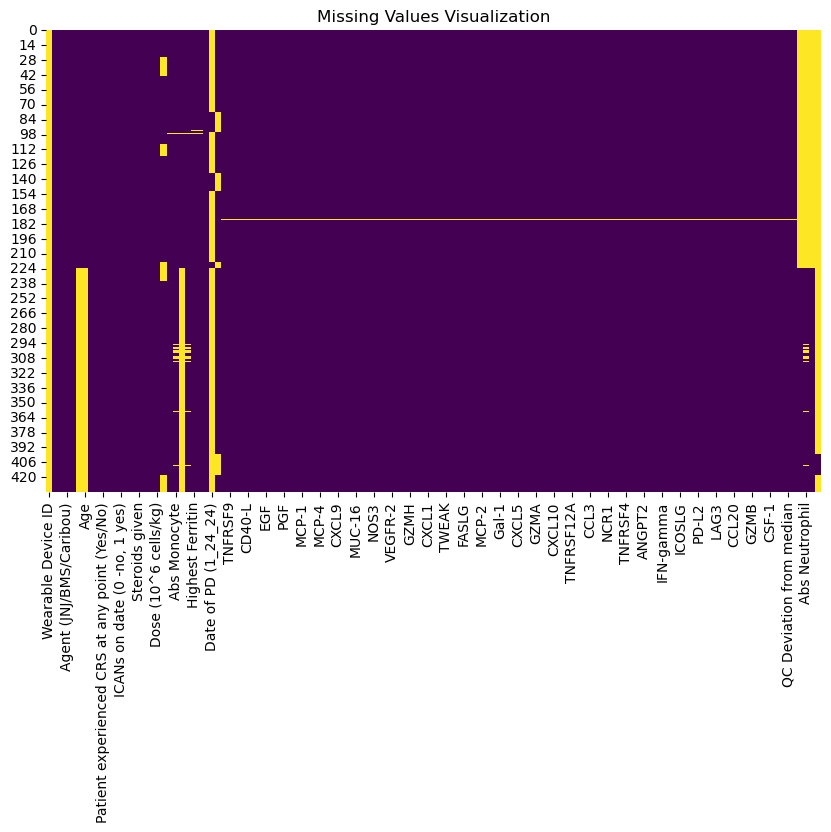

Wearable Device ID                                 434
Sample ID                                            0
PT_ID                                                0
Agent (JNJ/BMS/Caribou)                              0
Date of CAR-T infusion                               0
                                                  ... 
QC Deviation from median.1                           1
Patient experienced ICANS at any point (Yes/No)    224
Abs Neutrophil                                     235
Weight at time of infusion                         224
DOP                                                415
Length: 129, dtype: int64


In [91]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_cytokine.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()
print(df_cytokine.isnull().sum())

In [117]:
df_cytokine['Date of Sample'] = pd.to_datetime(df_cytokine['Date of Sample'])
df_cytokine = df_cytokine.sort_values(by = ['PT_ID', 'Date of Sample'])
df_cytokine_interpolated = df_cytokine.groupby("PT_ID").apply(lambda x:x.interpolate(method="linear"))
df_cytokine_interpolated.reset_index(drop=True, inplace=True)
df_cytokine_interpolated = df_cytokine_interpolated.groupby("PT_ID").apply(lambda x:x.ffill().bfill())
df_cytokine_interpolated = df_cytokine_interpolated.drop(columns=['Wearable Device ID'])

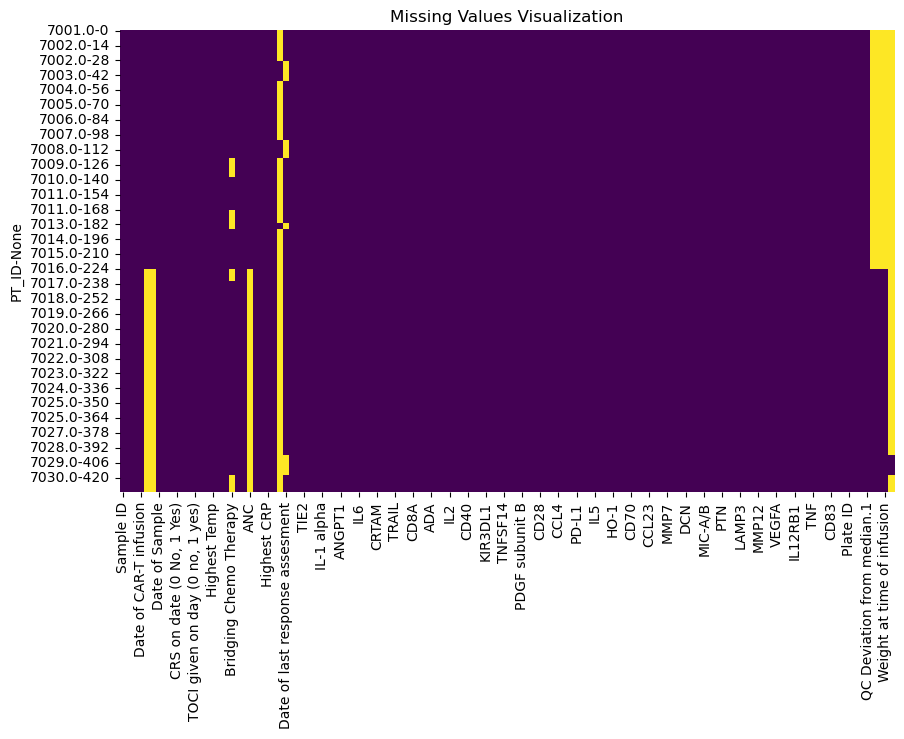

Sample ID                                            0
PT_ID                                                0
Agent (JNJ/BMS/Caribou)                              0
Date of CAR-T infusion                               0
DOB                                                210
                                                  ... 
QC Deviation from median.1                           0
Patient experienced ICANS at any point (Yes/No)    224
Abs Neutrophil                                     224
Weight at time of infusion                         224
DOP                                                415
Length: 128, dtype: int64


In [118]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_cytokine_interpolated.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()
print(df_cytokine_interpolated.isnull().sum())

In [119]:
df_filled.columns

Index(['patient_id', 'pr_display', 'spo2_display', 'resp_display',
       'pulse_rate_obscount', 'pulse_rate_avg', 'pulse_rate_min',
       'pulse_rate_max', 'pulse_rate_iqr', 'spo2_obscount', 'spo2_avg',
       'spo2_min', 'spo2_max', 'respiratory_rate_obscount',
       'respiratory_rate_avg', 'respiratory_rate_min', 'respiratory_rate_max',
       'covered_skin_temperature_obscount', 'covered_skin_temperature_avg',
       'covered_skin_temperature_min', 'covered_skin_temperature_max',
       'covered_axil_temperature_obscount', 'covered_axil_temperature_avg',
       'covered_axil_temperature_min', 'covered_axil_temperature_max',
       'motion_obscount', 'motion_avg', 'step_count_sum',
       'step_count_obscount', 'date', 'time', 'datetime', 'PT_ID'],
      dtype='object')

In [120]:


# Set display options to show all rows
pd.set_option('display.max_rows', None)

# Now print the results without truncation
print(df_cytokine_interpolated.isnull().sum())

# Optionally, reset display options after printing if you don't need to see all rows in future outputs
pd.reset_option('display.max_rows')


Sample ID                                            0
PT_ID                                                0
Agent (JNJ/BMS/Caribou)                              0
Date of CAR-T infusion                               0
DOB                                                210
Age                                                210
Date of Sample                                       0
Days in relation to CAR-T  infusion                  0
Patient experienced CRS at any point (Yes/No)        0
CRS on date (0 No, 1 Yes)                            0
CRS Grade                                            0
ICANs on date (0 -no, 1 yes)                         0
TOCI given on day (0 no, 1 yes)                      0
Anakinra given on day (0 no, 1 yes)                  0
Steroids given                                       0
Highest Temp                                         0
Total Cells infused (x10^6)                          0
Dose (10^6 cells/kg)                                 0
Bridging C

In [121]:
mode_value_therapy = df_cytokine_interpolated['Bridging Chemo Therapy'].mode()[0]  # Get the mode of the column
df_cytokine_interpolated["Bridging Chemo Therapy"].fillna(mode_value_therapy, inplace=True)
df_cytokine_interpolated['Age'].fillna(df_cytokine_interpolated['Age'].mean(),inplace=True)

# Convert the 'ANC' column to numeric, forcing any non-numeric values to NaN
df_cytokine_interpolated['ANC'] = pd.to_numeric(df_cytokine_interpolated['ANC'], errors='coerce')

df_cytokine_interpolated['ANC'].fillna(df_cytokine_interpolated['ANC'].mean(),inplace=True)
df_cytokine_interpolated['Weight at time of infusion'].fillna(df_cytokine_interpolated['Weight at time of infusion'].mean(),inplace=True)
mode_value_DoL = df_cytokine_interpolated['Date of last response assesment'].mode()[0]  # Get the mode of the column
df_cytokine_interpolated["Date of last response assesment"].fillna(mode_value_DoL, inplace=True)


column_to_remove = ['DOB','Date of PD (1_24_24)','Patient experienced ICANS at any point (Yes/No)', 'Abs Neutrophil','DOP']
df_cytokine_interpolated = df_cytokine_interpolated.drop(columns=column_to_remove)

In [122]:
# Set display options to show all rows
pd.set_option('display.max_rows', None)

# Now print the results without truncation
print(df_cytokine_interpolated.isnull().sum())

# Optionally, reset display options after printing if you don't need to see all rows in future outputs
pd.reset_option('display.max_rows')

Sample ID                                        0
PT_ID                                            0
Agent (JNJ/BMS/Caribou)                          0
Date of CAR-T infusion                           0
Age                                              0
Date of Sample                                   0
Days in relation to CAR-T  infusion              0
Patient experienced CRS at any point (Yes/No)    0
CRS on date (0 No, 1 Yes)                        0
CRS Grade                                        0
ICANs on date (0 -no, 1 yes)                     0
TOCI given on day (0 no, 1 yes)                  0
Anakinra given on day (0 no, 1 yes)              0
Steroids given                                   0
Highest Temp                                     0
Total Cells infused (x10^6)                      0
Dose (10^6 cells/kg)                             0
Bridging Chemo Therapy                           0
WBC                                              0
Abs Monocyte                   

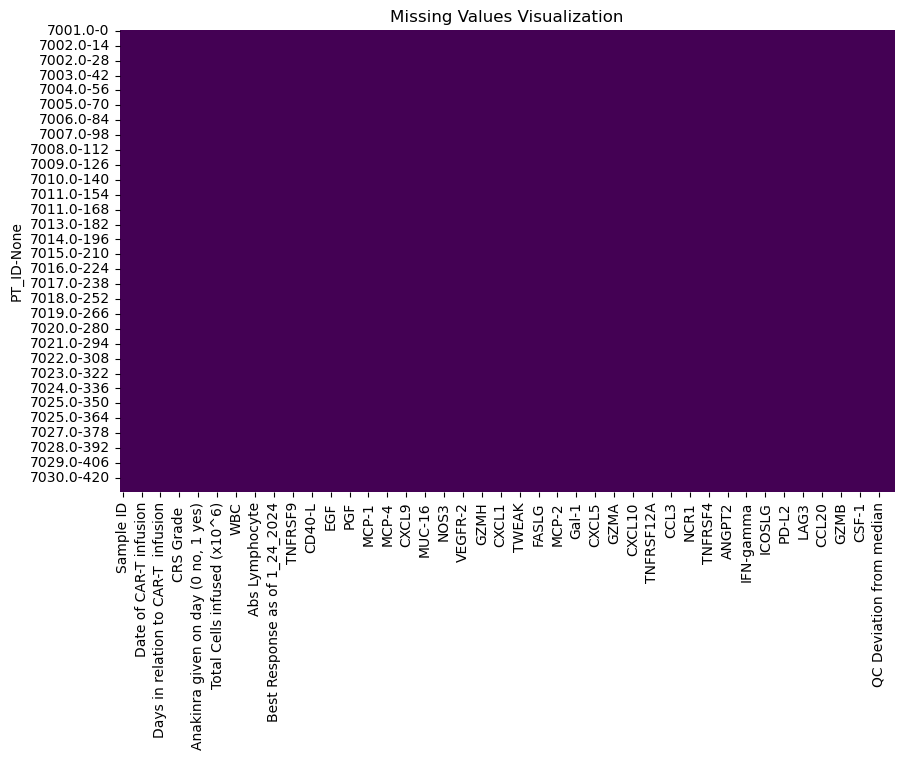

In [123]:
plt.figure(figsize=(10, 6))
sns.heatmap(df_cytokine_interpolated.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()

In [197]:
df_filled.to_csv("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/Filled_wearable_Data.csv")

#### Merge cytokine and wearable data

In [155]:
df_filled['PT_ID'] = df_filled['patient_id'].str.extract(r"(\d+)$")
df_filled['PT_ID']

0         7001
1         7001
2         7001
3         7001
4         7001
          ... 
331259    7029
331260    7029
331261    7029
331262    7029
331263    7029
Name: PT_ID, Length: 331264, dtype: object

In [236]:
df_filled['datetime']

0        2022-10-21 16:02:00
1        2022-10-21 16:03:00
2        2022-10-21 17:42:00
3        2022-10-21 17:43:00
4        2022-10-21 18:26:00
5        2022-10-21 18:27:00
6        2022-10-21 18:28:00
7        2022-10-21 18:29:00
8        2022-10-21 18:30:00
9        2022-10-21 18:31:00
10       2022-10-21 18:32:00
11       2022-10-21 18:33:00
12       2022-10-21 18:34:00
13       2022-10-21 18:35:00
14       2022-10-21 18:36:00
15       2022-10-21 18:37:00
16       2022-10-21 18:38:00
17       2022-10-21 18:39:00
18       2022-10-21 18:40:00
19       2022-10-21 18:41:00
20       2022-10-21 18:42:00
21       2022-10-21 18:43:00
22       2022-10-21 18:44:00
23       2022-10-21 18:45:00
24       2022-10-21 18:46:00
25       2022-10-21 18:47:00
26       2022-10-21 18:48:00
27       2022-10-21 18:49:00
28       2022-10-21 18:50:00
29       2022-10-21 18:51:00
30       2022-10-21 18:52:00
31       2022-10-21 18:53:00
32       2022-10-21 18:54:00
33       2022-10-21 18:55:00
34       2022-

In [237]:
df_cytokine_interpolated.reset_index(drop=True, inplace=True)

df_cytokine_interpolated['Date of Sample']

0     2022-10-21
1     2022-10-22
2     2022-10-22
3     2022-10-23
4     2022-10-24
5     2022-10-25
6     2022-10-26
7     2022-10-27
8     2022-10-28
9     2022-10-29
10    2022-10-30
11    2022-10-31
12    2022-10-25
13    2022-10-25
14    2022-10-25
15    2022-10-25
16    2022-10-25
17    2022-10-26
18    2022-10-27
19    2022-10-28
20    2022-10-30
21    2022-10-31
22    2022-11-01
23    2022-11-02
24    2022-11-03
25    2022-11-04
26    2022-11-05
27    2022-11-06
28    2022-11-07
29    2022-11-09
30    2022-11-09
31    2022-11-10
32    2022-11-11
33    2022-11-11
34    2022-11-12
35    2022-11-13
36    2022-11-14
37    2022-11-15
38    2022-11-16
39    2022-11-17
40    2022-11-18
41    2022-11-19
42    2022-11-20
43    2022-11-21
44    2022-11-22
45    2022-11-23
46    2022-11-28
47    2022-12-06
48    2022-12-05
49    2022-12-06
50    2022-12-07
51    2022-12-08
52    2022-12-09
53    2022-12-10
54    2022-12-11
55    2022-12-12
56    2022-12-13
57    2022-12-14
58    2022-12-

In [265]:
df_cytokine_cleaned = df_cytokine_interpolated
df_wearable_cleaned = df_filled

In [266]:
import pandas as pd

# Assuming `df_filled` is the minute-level dataset with columns ['PT_ID', 'datetime', ...]
# and `df_cytokine_interpolated` is the daily biomarkers dataset with columns ['PT_ID', 'Date of Sample', ...]

# Convert 'Date of Sample' to datetime format
df_cytokine_cleaned['Date of Sample'] = pd.to_datetime(df_cytokine_cleaned['Date of Sample'])

# Rename 'Date of Sample' to 'datetime' to facilitate merging
df_cytokine_cleaned = df_cytokine_cleaned.rename(columns={'Date of Sample': 'datetime'})

df_wearable_cleaned['PT_ID'] = df_wearable_cleaned['PT_ID'].astype(str)
df_cytokine_cleaned['PT_ID'] = df_cytokine_cleaned['PT_ID'].astype(int).astype(str)
df_wearable_cleaned['datetime'] = pd.to_datetime(df_wearable_cleaned['datetime'])
df_cytokine_cleaned['datetime'] = pd.to_datetime(df_cytokine_cleaned['datetime'])

# Merge daily biomarkers data with minute-level data using merge_asof
# This will assign the nearest previous daily biomarkers data to each minute entry
merged_data = pd.merge_asof(
    df_wearable_cleaned.sort_values('datetime'),
    df_cytokine_cleaned.sort_values('datetime'),
    on='datetime',
    by='PT_ID',
    direction='backward'  # Use the most recent previous daily data for each minute
)

# Interpolate the biomarkers data across minute intervals
merged_data.interpolate(method='linear', inplace=True)

# Checking the result
print(merged_data.head())


  patient_id    pr_display spo2_display resp_display  pulse_rate_obscount  \
0  WEAR_7001  71 beats/min          96%          17%                 10.0   
1  WEAR_7001  71 beats/min          96%          17%                 10.0   
2  WEAR_7001  71 beats/min          96%          17%                 10.0   
3  WEAR_7001  71 beats/min          96%          17%                 10.0   
4  WEAR_7001  71 beats/min          96%          17%                 10.0   

   pulse_rate_avg  pulse_rate_min  pulse_rate_max  pulse_rate_iqr  \
0           70.01           66.63           71.52            2.88   
1           70.01           66.63           71.52            2.88   
2           70.01           66.63           71.52            2.88   
3           70.01           66.63           71.52            2.88   
4           70.01           66.63           71.52            2.88   

   spo2_obscount  ...    KLRD1     GZMB    CD83     IL12    CSF-1  \
0            6.0  ...  4.53595  0.26781  2.6916  5.68

In [267]:
# Extract the date part for grouping by day
merged_data['date'] = merged_data['datetime'].dt.date

# List of biomarker columns to interpolate
biomarker_columns = df_cytokine_cleaned.columns.difference(['PT_ID', 'datetime'])

# Keep only the first row of each day for each patient
first_rows = merged_data.drop_duplicates(subset=['PT_ID', 'date'], keep='first')

# Set biomarker columns to NaN for rows that are not the first entry of each day
merged_data.loc[~merged_data.index.isin(first_rows.index), biomarker_columns] = np.nan

# Interpolate biomarkers data within each patient across the minute intervals
merged_data[biomarker_columns] = merged_data.groupby(['PT_ID'])[biomarker_columns].transform(lambda group: group.interpolate(method='linear'))

# Drop the temporary 'date' column if no longer needed
merged_data.drop(columns=['date'], inplace=True)

# Checking the result
print(merged_data.head())


  patient_id    pr_display spo2_display resp_display  pulse_rate_obscount  \
0  WEAR_7001  71 beats/min          96%          17%                 10.0   
1  WEAR_7001  71 beats/min          96%          17%                 10.0   
2  WEAR_7001  71 beats/min          96%          17%                 10.0   
3  WEAR_7001  71 beats/min          96%          17%                 10.0   
4  WEAR_7001  71 beats/min          96%          17%                 10.0   

   pulse_rate_avg  pulse_rate_min  pulse_rate_max  pulse_rate_iqr  \
0           70.01           66.63           71.52            2.88   
1           70.01           66.63           71.52            2.88   
2           70.01           66.63           71.52            2.88   
3           70.01           66.63           71.52            2.88   
4           70.01           66.63           71.52            2.88   

   spo2_obscount  ...     KLRD1      GZMB      CD83      IL12     CSF-1  \
0            6.0  ...  4.535950  0.267810  2.69

In [271]:
merged_data.isna().sum()

patient_id                                       0
pr_display                                       0
spo2_display                                     0
resp_display                                     0
pulse_rate_obscount                              0
pulse_rate_avg                                   0
pulse_rate_min                                   0
pulse_rate_max                                   0
pulse_rate_iqr                                   0
spo2_obscount                                    0
spo2_avg                                         0
spo2_min                                         0
spo2_max                                         0
respiratory_rate_obscount                        0
respiratory_rate_avg                             0
respiratory_rate_min                             0
respiratory_rate_max                             0
covered_skin_temperature_obscount                0
covered_skin_temperature_avg                     0
covered_skin_temperature_min   

In [242]:
# Get time range for each patient in wearable data
wearable_time_range = df_wearable_cleaned.groupby('PT_ID')['datetime'].agg(['min', 'max']).reset_index()
wearable_time_range.columns = ['PT_ID', 'start_time_wearable', 'end_time_wearable']

# Get time range for each patient in cytokine data
df_cytokine_cleaned['PT_ID'] = df_cytokine_cleaned['PT_ID'].astype(int).astype(str)
cytokine_time_range = df_cytokine_cleaned.groupby('PT_ID')['datetime'].agg(['min', 'max']).reset_index()
cytokine_time_range.columns = ['PT_ID', 'start_time_cytokine', 'end_time_cytokine']

# Merge to compare date ranges
time_ranges = pd.merge(wearable_time_range, cytokine_time_range, on='PT_ID', how='left')
print(time_ranges)


   PT_ID start_time_wearable   end_time_wearable start_time_cytokine  \
0   7001 2022-10-21 16:02:00 2022-11-02 16:48:00          2022-10-21   
1   7002 2022-10-25 22:06:00 2022-11-09 16:35:00          2022-10-25   
2   7003 2022-11-09 17:20:00 2022-11-23 09:30:00          2022-11-09   
3   7004 2022-12-05 15:44:00 2022-12-18 09:30:00          2022-12-05   
4   7005 2022-12-07 21:27:00 2022-12-20 15:57:00          2022-12-08   
5   7006 2022-12-14 16:42:00 2022-12-23 13:51:00          2022-12-14   
6   7007 2023-01-06 17:21:00 2023-01-19 18:54:00          2023-01-07   
7   7008 2023-01-23 15:31:00 2023-02-05 08:08:00          2023-01-23   
8   7009 2023-01-24 15:37:00 2023-02-07 16:30:00          2023-01-24   
9   7010 2023-01-30 22:08:00 2023-02-14 14:47:00          2023-01-31   
10  7011 2023-02-07 16:18:00 2023-02-23 04:57:00          2023-02-07   
11  7012 2023-02-09 18:09:00 2023-02-23 14:57:00          2023-02-09   
12  7013 2023-03-13 16:26:00 2023-03-26 03:19:00          2023-0

In [270]:
# Interpolate missing values
merged_data.interpolate(method='linear', inplace=True)

# Forward and backward fill for edge cases
merged_data.fillna(method='ffill', inplace=True)
merged_data.fillna(method='bfill', inplace=True)
merged_data.head()

,patient_id,pr_display,spo2_display,resp_display,pulse_rate_obscount,pulse_rate_avg,pulse_rate_min,pulse_rate_max,pulse_rate_iqr,spo2_obscount,...,GZMB,CD83,IL12,CSF-1,Plate ID,QC Warning,QC Deviation from median,QC Deviation from median.1,Weight at time of infusion,date
0,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,0.267810,2.691600,5.689550,9.600130,ADRO04_IO_Plate01_11082023,Pass,0.039684,0.047985,74.325238,2022-10-21
1,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,0.272532,2.692676,5.693478,9.601736,ADRO04_IO_Plate01_11082023,Pass,0.040019,0.048222,74.325238,2022-10-21
2,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,0.277253,2.693753,5.697407,9.603342,ADRO04_IO_Plate01_11082023,Pass,0.040354,0.048458,74.325238,2022-10-21
3,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,0.281975,2.694829,5.701335,9.604948,ADRO04_IO_Plate01_11082023,Pass,0.040689,0.048695,74.325238,2022-10-21
4,WEAR_7001,71 beats/min,96%,17%,10.0,70.01,66.63,71.52,2.88,6.0,...,0.286696,2.695906,5.705263,9.606554,ADRO04_IO_Plate01_11082023,Pass,0.041024,0.048931,74.325238,2022-10-21


In [209]:
list(merged_data.columns)

['patient_id',
 'pr_display',
 'spo2_display',
 'resp_display',
 'pulse_rate_obscount',
 'pulse_rate_avg',
 'pulse_rate_min',
 'pulse_rate_max',
 'pulse_rate_iqr',
 'spo2_obscount',
 'spo2_avg',
 'spo2_min',
 'spo2_max',
 'respiratory_rate_obscount',
 'respiratory_rate_avg',
 'respiratory_rate_min',
 'respiratory_rate_max',
 'covered_skin_temperature_obscount',
 'covered_skin_temperature_avg',
 'covered_skin_temperature_min',
 'covered_skin_temperature_max',
 'covered_axil_temperature_obscount',
 'covered_axil_temperature_avg',
 'covered_axil_temperature_min',
 'covered_axil_temperature_max',
 'motion_obscount',
 'motion_avg',
 'step_count_sum',
 'step_count_obscount',
 'date',
 'time',
 'datetime',
 'PT_ID',
 'Date',
 'Sample ID',
 'Agent (JNJ/BMS/Caribou)',
 'Date of CAR-T infusion',
 'Age',
 'Days in relation to CAR-T  infusion',
 'Patient experienced CRS at any point (Yes/No)',
 'CRS on date (0 No, 1 Yes)',
 'CRS Grade ',
 'ICANs on date (0 -no, 1 yes)',
 'TOCI given on day (0 no, 

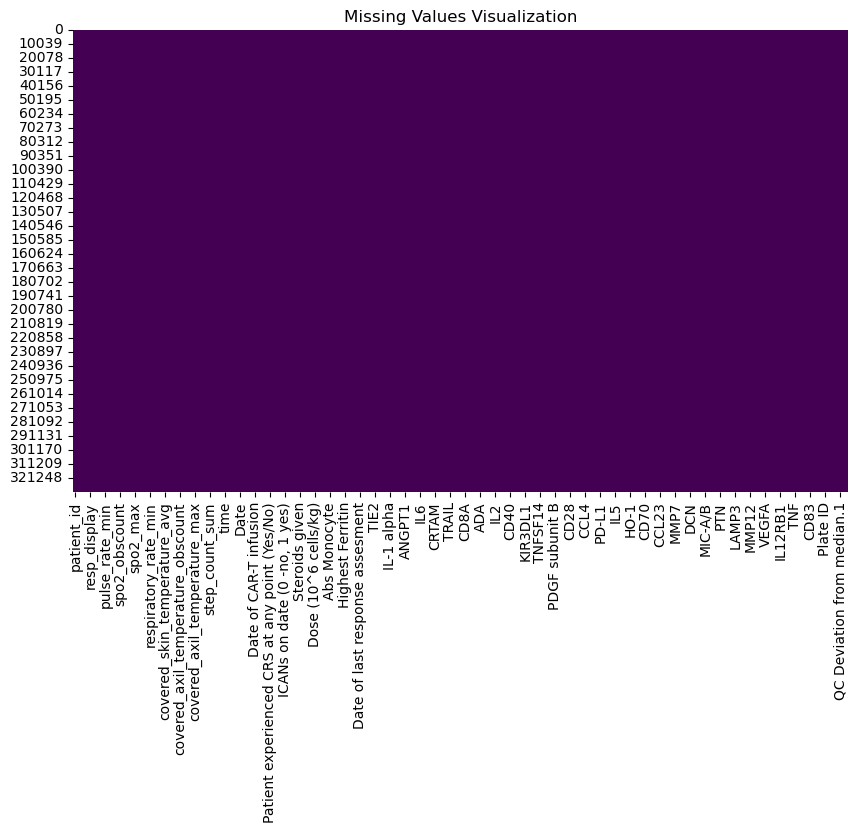

In [200]:
plt.figure(figsize=(10, 6))
sns.heatmap(merged_data.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Visualization")
plt.show()

In [201]:
# Set display options to show all rows
pd.set_option('display.max_rows', None)

# Now print the results without truncation
print(merged_data.isnull().sum())

# Optionally, reset display options after printing if you don't need to see all rows in future outputs
pd.reset_option('display.max_rows')

patient_id                                       0
pr_display                                       0
spo2_display                                     0
resp_display                                     0
pulse_rate_obscount                              0
pulse_rate_avg                                   0
pulse_rate_min                                   0
pulse_rate_max                                   0
pulse_rate_iqr                                   0
spo2_obscount                                    0
spo2_avg                                         0
spo2_min                                         0
spo2_max                                         0
respiratory_rate_obscount                        0
respiratory_rate_avg                             0
respiratory_rate_min                             0
respiratory_rate_max                             0
covered_skin_temperature_obscount                0
covered_skin_temperature_avg                     0
covered_skin_temperature_min   

In [206]:
ID_match = pd.read_csv("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/ID_match")
ID_match

,CH_ID\tOlink_ID
0,1e1acd61-e506-4d15-b442-b84b0236d2be\tWEAR_7001
1,9e9e94c7-01a6-4840-8240-eaa4c13a95ca\tWEAR_7002
2,f90f3710-cbf9-4a8e-92c2-e6144b89bcff\tWEAR_7003
3,46a8959e-a3ef-49c4-99b4-6abd2341bed8\tWEAR_7004
4,2e5a988f-4e78-4648-ba15-60c43e33f72e\tWEAR_7005
5,7af1b94f-d193-4220-9437-d84a329a7e88\tWEAR_7006
6,65038550-1e25-4fd5-934a-7574c55ea662\tWEAR_7007
7,4f191869-d131-44f1-b6db-3d7dbfc77abd\tWEAR_7008
8,398a8fc9-e1ef-4dfd-8b72-7a93b4fe777c\tWEAR_7009
9,38a0fa6b-acf9-4204-a4a4-ea06da443987\tWEAR_7010


In [207]:
ID_match[["CH_ID", "Olink_ID"]] = ID_match["CH_ID\tOlink_ID"].str.split("\t", expand = True)
ID_match['Olink_ID'] = ID_match["Olink_ID"].str.extract(r"(\d+)$")
ID_match = ID_match.drop(columns=["CH_ID\tOlink_ID"])
ID_match

,CH_ID,Olink_ID
0,1e1acd61-e506-4d15-b442-b84b0236d2be,7001
1,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,7002
2,f90f3710-cbf9-4a8e-92c2-e6144b89bcff,7003
3,46a8959e-a3ef-49c4-99b4-6abd2341bed8,7004
4,2e5a988f-4e78-4648-ba15-60c43e33f72e,7005
5,7af1b94f-d193-4220-9437-d84a329a7e88,7006
6,65038550-1e25-4fd5-934a-7574c55ea662,7007
7,4f191869-d131-44f1-b6db-3d7dbfc77abd,7008
8,398a8fc9-e1ef-4dfd-8b72-7a93b4fe777c,7009
9,38a0fa6b-acf9-4204-a4a4-ea06da443987,7010


In [283]:
Nurse_data = pd.read_csv("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/Updated_Nurse_Data_with_UTC_Timestamp (1).csv")
Nurse_data.head(5)

,patient id,training_data,Enrolled,CAR-T infusion date Morning time,CAR-T infusion date,CAR-T product,First CRS timestamp (by RN),CRS marker at 1st timesamp,Subsequent CRS timestamps (by RN) and markrs,CRS Grade (max),CRS intervention,ICANS Grade,Standardized CAR-T product,Standardized First CRS timestamp (by RN) and subsequent,Temperature,SpO2,BP,HR,Standardized First CRS timestamp (by RN) and subsequent (UTC)
0,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,10/25/22,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,"IVF, Tocilizumab x 1 on (10/29/22)",0,Abecma,10/26/22 13:00,100F,WNL,WNL,WNL,2022-10-26 13:00:00+00:00
1,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,"IVF, Tocilizumab x 1 on (10/29/22)",0,Abecma,10/28/22 15:22,100.9F,WNL,WNL,WNL,2022-10-28 15:22:00+00:00
2,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,"IVF, Tocilizumab x 1 on (10/29/22)",0,Abecma,10/29/22 00:22,100.9F,WNL,WNL,WNL,2022-10-29 00:22:00+00:00
3,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,"IVF, Tocilizumab x 1 on (10/29/22)",0,Abecma,10/29/22 15:23,100.9F,WNL,WNL,WNL,2022-10-29 15:23:00+00:00
4,7af1b94f-d193-4220-9437-d84a329a7e88,1,12/14/22,2022-12-14 07:06:00,12/14/22,Abecma,NaN,NaN,NaN,0,"IVF, Tocilizumab x 1 on (10/29/22)",0,Abecma,NaN,WNL,WNL,WNL,WNL,NaN


In [284]:
Nurse_data = pd.merge(Nurse_data, ID_match, left_on="patient id", right_on="CH_ID",how="left")
Nurse_data.head(5)

,patient id,training_data,Enrolled,CAR-T infusion date Morning time,CAR-T infusion date,CAR-T product,First CRS timestamp (by RN),CRS marker at 1st timesamp,Subsequent CRS timestamps (by RN) and markrs,CRS Grade (max),...,ICANS Grade,Standardized CAR-T product,Standardized First CRS timestamp (by RN) and subsequent,Temperature,SpO2,BP,HR,Standardized First CRS timestamp (by RN) and subsequent (UTC),CH_ID,Olink_ID
0,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,10/25/22,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,...,0,Abecma,10/26/22 13:00,100F,WNL,WNL,WNL,2022-10-26 13:00:00+00:00,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,7002
1,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,...,0,Abecma,10/28/22 15:22,100.9F,WNL,WNL,WNL,2022-10-28 15:22:00+00:00,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,7002
2,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,...,0,Abecma,10/29/22 00:22,100.9F,WNL,WNL,WNL,2022-10-29 00:22:00+00:00,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,7002
3,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,1,10/25/22,2022-10-25 08:58:00,NaN,Abecma,10/26/22 at 13:00,"Temp 100F, SpO2 WNL, BP WNL","10/28/22 at 15:22 (100.9F), 10/29/22 at 00:22 ...",1,...,0,Abecma,10/29/22 15:23,100.9F,WNL,WNL,WNL,2022-10-29 15:23:00+00:00,9e9e94c7-01a6-4840-8240-eaa4c13a95ca,7002
4,7af1b94f-d193-4220-9437-d84a329a7e88,1,12/14/22,2022-12-14 07:06:00,12/14/22,Abecma,NaN,NaN,NaN,0,...,0,Abecma,NaN,WNL,WNL,WNL,WNL,NaN,7af1b94f-d193-4220-9437-d84a329a7e88,7006


In [322]:
selected_list = ['Olink_ID', 'CRS intervention ','Standardized First CRS timestamp (by RN) and subsequent (UTC)','CRS Grade (max)','Temperature','SpO2', 'BP', 'HR']
Nurse_data_selected = Nurse_data[selected_list]
Nurse_data_selected

,Olink_ID,CRS intervention,Standardized First CRS timestamp (by RN) and subsequent (UTC),CRS Grade (max),Temperature,SpO2,BP,HR
0,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-26 13:00:00+00:00,1,100F,WNL,WNL,WNL
1,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-28 15:22:00+00:00,1,100.9F,WNL,WNL,WNL
2,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-29 00:22:00+00:00,1,100.9F,WNL,WNL,WNL
3,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-29 15:23:00+00:00,1,100.9F,WNL,WNL,WNL
4,7006,"IVF, Tocilizumab x 1 on (10/29/22)",NaN,0,WNL,WNL,WNL,WNL
5,7007,Tocilizumab x 1 on 1/14/23,2023-01-14 23:00:00+00:00,1,101.3F,WNL,WNL,WNL
6,7007,Tocilizumab x 1 on 1/14/23,2023-01-15 15:42:00+00:00,1,101F,WNL,WNL,WNL
7,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 04:20:00+00:00,3,100.6F,WNL,WNL,WNL
8,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 07:30:00+00:00,3,100.6F,WNL,WNL,WNL
9,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 11:18:00+00:00,3,101.6F,WNL,WNL,WNL


In [323]:
Nurse_data_selected_cleaned = Nurse_data_selected.dropna(subset=['Olink_ID'])
Nurse_data_selected_cleaned.sort_values(by=['Olink_ID']).head()

,Olink_ID,CRS intervention,Standardized First CRS timestamp (by RN) and subsequent (UTC),CRS Grade (max),Temperature,SpO2,BP,HR
16,7001,Tocilizumab x 1 on 1/22/24,2022-10-22 04:45:00+00:00,1,WNL,WNL,WNL,WNL
15,7001,Tocilizumab x 1 on 1/22/24,2022-01-21 23:30:00+00:00,1,100.9F,WNL,WNL,WNL
0,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-26 13:00:00+00:00,1,100F,WNL,WNL,WNL
1,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-28 15:22:00+00:00,1,100.9F,WNL,WNL,WNL
2,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-29 00:22:00+00:00,1,100.9F,WNL,WNL,WNL


In [324]:
Nurse_data_selected_cleaned = Nurse_data_selected_cleaned.rename(columns={"Olink_ID":"patient_id","Standardized First CRS timestamp (by RN) and subsequent (UTC)":"datetime"})
Nurse_data_selected_cleaned['datetime'] = pd.to_datetime(Nurse_data_selected_cleaned['datetime']).dt.tz_localize(None)

In [325]:
Nurse_data_selected_cleaned

,patient_id,CRS intervention,datetime,CRS Grade (max),Temperature,SpO2,BP,HR
0,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-26 13:00:00,1,100F,WNL,WNL,WNL
1,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-28 15:22:00,1,100.9F,WNL,WNL,WNL
2,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-29 00:22:00,1,100.9F,WNL,WNL,WNL
3,7002,"IVF, Tocilizumab x 1 on (10/29/22)",2022-10-29 15:23:00,1,100.9F,WNL,WNL,WNL
4,7006,"IVF, Tocilizumab x 1 on (10/29/22)",NaT,0,WNL,WNL,WNL,WNL
5,7007,Tocilizumab x 1 on 1/14/23,2023-01-14 23:00:00,1,101.3F,WNL,WNL,WNL
6,7007,Tocilizumab x 1 on 1/14/23,2023-01-15 15:42:00,1,101F,WNL,WNL,WNL
7,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 04:20:00,3,100.6F,WNL,WNL,WNL
8,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 07:30:00,3,100.6F,WNL,WNL,WNL
9,7009,"Tocilizumab x 2 on 1/25/23 and 1/30/23, Anakin...",2023-01-25 11:18:00,3,101.6F,WNL,WNL,WNL


In [414]:
merged_data['patient_id'] = merged_data['patient_id'].str.replace("WEAR_", "")
final_data = pd.merge(
    merged_data,
    Nurse_data_selected_cleaned,
    on=['patient_id', 'datetime'],
    how='left'  # Use 'left' to keep all rows in merged_data, or 'inner' for only matching rows
)

# Check the result
print(final_data.head())

  patient_id    pr_display spo2_display resp_display  pulse_rate_obscount  \
0       7001  71 beats/min          96%          17%                 10.0   
1       7001  71 beats/min          96%          17%                 10.0   
2       7001  71 beats/min          96%          17%                 10.0   
3       7001  71 beats/min          96%          17%                 10.0   
4       7001  71 beats/min          96%          17%                 10.0   

   pulse_rate_avg  pulse_rate_min  pulse_rate_max  pulse_rate_iqr  \
0           70.01           66.63           71.52            2.88   
1           70.01           66.63           71.52            2.88   
2           70.01           66.63           71.52            2.88   
3           70.01           66.63           71.52            2.88   
4           70.01           66.63           71.52            2.88   

   spo2_obscount  ...  QC Deviation from median  QC Deviation from median.1  \
0            6.0  ...                  0.03

In [415]:
import pandas as pd

# Ensure the 'patient_id' and 'datetime' columns are compatible between datasets
merged_data['patient_id'] = merged_data['patient_id'].astype(str)
Nurse_data_selected_cleaned['patient_id'] = Nurse_data_selected_cleaned['patient_id'].astype(str)

# Convert datetime columns to datetime type
merged_data['datetime'] = pd.to_datetime(merged_data['datetime'])
Nurse_data_selected_cleaned['datetime'] = pd.to_datetime(Nurse_data_selected_cleaned['datetime'])

# Perform an exact merge to retain only matching rows
exact_merge = pd.merge(
    Nurse_data_selected_cleaned,
    merged_data,
    on=['patient_id', 'datetime'],
    how='inner'
)

# Identify unmatched rows in Nurse_data_selected_cleaned
unmatched_rows = Nurse_data_selected_cleaned[~Nurse_data_selected_cleaned.set_index(['patient_id', 'datetime']).index.isin(exact_merge.set_index(['patient_id', 'datetime']).index)]

# Concatenate unmatched rows back with the exact merge
combined_data = pd.concat([exact_merge, unmatched_rows], ignore_index=True).sort_values(['patient_id', 'datetime']).reset_index(drop=True)

# Fill missing values using the nearest available data by timestamp within each patient
# We fill each group separately to avoid index mismatch issues
for patient_id, group in combined_data.groupby('patient_id'):
    combined_data.loc[group.index, merged_data.columns.difference(['patient_id', 'datetime'])] = (
        group[merged_data.columns.difference(['patient_id', 'datetime'])].fillna(method='ffill').fillna(method='bfill')
    )

# Check the result
final_data = pd.concat([final_data, combined_data], ignore_index=True).sort_values(['patient_id', 'datetime']).reset_index(drop=True)

# Drop any duplicate rows if needed
final_data = final_data.drop_duplicates(subset=['patient_id', 'datetime'], keep='first')

# Check the result
print(final_data.head())



  patient_id    pr_display spo2_display resp_display  pulse_rate_obscount  \
0       7001  90 beats/min          95%          20%                 30.0   
1       7001  71 beats/min          96%          17%                 10.0   
2       7001  71 beats/min          96%          17%                 10.0   
3       7001  71 beats/min          96%          17%                 10.0   
4       7001  71 beats/min          96%          17%                 10.0   

   pulse_rate_avg  pulse_rate_min  pulse_rate_max  pulse_rate_iqr  \
0           89.65           88.63           90.00            0.58   
1           70.01           66.63           71.52            2.88   
2           70.01           66.63           71.52            2.88   
3           70.01           66.63           71.52            2.88   
4           70.01           66.63           71.52            2.88   

   spo2_obscount  ...  QC Deviation from median  QC Deviation from median.1  \
0           30.0  ...                  0.09

In [416]:
final_data.isna().sum()

patient_id                                            0
pr_display                                           18
spo2_display                                         18
resp_display                                         18
pulse_rate_obscount                                  18
pulse_rate_avg                                       18
pulse_rate_min                                       18
pulse_rate_max                                       18
pulse_rate_iqr                                       18
spo2_obscount                                        18
spo2_avg                                             18
spo2_min                                             18
spo2_max                                             18
respiratory_rate_obscount                            18
respiratory_rate_avg                                 18
respiratory_rate_min                                 18
respiratory_rate_max                                 18
covered_skin_temperature_obscount               

In [417]:
import pandas as pd
import numpy as np

# Assume the column is named 'Temperature'
# Remove non-numeric values (like 'WNL') and the "F" suffix, and convert to float
final_data['Temperature'] = pd.to_numeric(final_data['Temperature'].str.replace('F', ''), errors='coerce')



# Convert Fahrenheit to Celsius
final_data['Temperature_C'] = (final_data['Temperature'] - 32) * 5/9



In [418]:
temperature_cols = [col for col in final_data.columns if "temperature" in col.lower()]
temperature_cols

['covered_skin_temperature_obscount',
 'covered_skin_temperature_avg',
 'covered_skin_temperature_min',
 'covered_skin_temperature_max',
 'covered_axil_temperature_obscount',
 'covered_axil_temperature_avg',
 'covered_axil_temperature_min',
 'covered_axil_temperature_max',
 'Temperature',
 'Temperature_C']

In [419]:
[col for col in final_data.columns if "crs" in col.lower()]

['Patient experienced CRS at any point (Yes/No)',
 'CRS on date (0 No, 1 Yes)',
 'CRS Grade ',
 'CRS intervention ',
 'CRS Grade (max)']

In [420]:
final_data[~final_data['Temperature'].isna()][temperature_cols]

,covered_skin_temperature_obscount,covered_skin_temperature_avg,covered_skin_temperature_min,covered_skin_temperature_max,covered_axil_temperature_obscount,covered_axil_temperature_avg,covered_axil_temperature_min,covered_axil_temperature_max,Temperature,Temperature_C
0,2.000000,37.570000,37.570000,37.580000,1.0,38.650000,38.650000,38.650000,100.9,38.277778
10547,1.750000,35.545000,35.537500,35.545000,1.0,36.030000,36.030000,36.030000,100.0,37.777778
13435,2.000000,30.380000,30.370000,30.380000,1.0,23.780000,23.780000,23.780000,100.9,38.277778
13976,2.000000,35.390000,35.380000,35.390000,1.0,35.720000,35.720000,35.720000,100.9,38.277778
14878,2.000000,31.730000,31.710000,31.750000,1.0,35.965269,35.965269,35.965269,100.9,38.277778
29872,3.000000,34.200000,33.480000,35.640000,1.0,37.615714,37.615714,37.615714,100.6,38.111111
30808,2.000000,35.860000,35.850000,35.870000,1.0,34.105000,34.105000,34.105000,102.5,39.166667
63646,1.000000,37.250000,37.250000,37.250000,1.0,36.310000,36.310000,36.310000,101.5,38.611111
82169,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.3,38.500000
82384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.0,38.333333


In [421]:
final_data = final_data.rename(columns={"CRS Grade (max)":"CRS Grade (nurse)"})

In [422]:
import pandas as pd

# Ensure CRS Grade is numeric to allow comparison
final_data['CRS Grade (nurse)'] = pd.to_numeric(final_data['CRS Grade (nurse)'], errors='coerce')

# Define a function to apply the transformation for each patient group
def update_crs_status(group):
    # Find the first row where CRS Grade > 0 and is not null
    first_crs_index = group.loc[(group['CRS Grade (nurse)'] > 0) & group['CRS Grade (nurse)'].notna()].index.min()
    
    # If such a row exists, set "Patient experienced CRS at any point (Yes/No)" to "No" for rows before it
    if not pd.isna(first_crs_index):
        group.loc[group.index < first_crs_index, "Patient experienced CRS at any point (Yes/No)"] = "No"
    
    # Return the updated group
    return group

# Apply the function to each patient group
final_data = final_data.groupby('patient_id', group_keys=False).apply(update_crs_status)

# Check the result
print(final_data[['patient_id', 'datetime', 'CRS Grade (nurse)', 'Patient experienced CRS at any point (Yes/No)']].head())


  patient_id            datetime  CRS Grade (nurse)  \
0       7001 2022-01-21 23:30:00                1.0   
1       7001 2022-10-21 16:02:00                NaN   
2       7001 2022-10-21 16:03:00                NaN   
3       7001 2022-10-21 17:42:00                NaN   
4       7001 2022-10-21 17:43:00                NaN   

  Patient experienced CRS at any point (Yes/No)  
0                                           Yes  
1                                           Yes  
2                                           Yes  
3                                           Yes  
4                                           Yes  


In [423]:
final_data.isna().sum()

patient_id                                            0
pr_display                                           18
spo2_display                                         18
resp_display                                         18
pulse_rate_obscount                                  18
pulse_rate_avg                                       18
pulse_rate_min                                       18
pulse_rate_max                                       18
pulse_rate_iqr                                       18
spo2_obscount                                        18
spo2_avg                                             18
spo2_min                                             18
spo2_max                                             18
respiratory_rate_obscount                            18
respiratory_rate_avg                                 18
respiratory_rate_min                                 18
respiratory_rate_max                                 18
covered_skin_temperature_obscount               

In [424]:
# List of columns to exclude from forward fill
exclude_columns = [
    'CRS intervention', 
    'CRS Grade (nurse)', 
    'Temperature', 
    'SpO2', 
    'BP', 
    'HR', 
    'Temperature_C'
]

# Create a list of columns to apply forward fill
fill_columns = [col for col in final_data.columns if col not in exclude_columns]

# Apply forward fill only on the selected columns
final_data[fill_columns] = final_data[fill_columns].fillna(method='ffill')

# Check the result
print(final_data.head())


  patient_id    pr_display spo2_display resp_display  pulse_rate_obscount  \
0       7001  90 beats/min          95%          20%                 30.0   
1       7001  71 beats/min          96%          17%                 10.0   
2       7001  71 beats/min          96%          17%                 10.0   
3       7001  71 beats/min          96%          17%                 10.0   
4       7001  71 beats/min          96%          17%                 10.0   

   pulse_rate_avg  pulse_rate_min  pulse_rate_max  pulse_rate_iqr  \
0           89.65           88.63           90.00            0.58   
1           70.01           66.63           71.52            2.88   
2           70.01           66.63           71.52            2.88   
3           70.01           66.63           71.52            2.88   
4           70.01           66.63           71.52            2.88   

   spo2_obscount  ...  QC Deviation from median.1  Weight at time of infusion  \
0           30.0  ...                    

In [425]:
final_data.isna().sum()

patient_id                                            0
pr_display                                            0
spo2_display                                          0
resp_display                                          0
pulse_rate_obscount                                   0
pulse_rate_avg                                        0
pulse_rate_min                                        0
pulse_rate_max                                        0
pulse_rate_iqr                                        0
spo2_obscount                                         0
spo2_avg                                              0
spo2_min                                              0
spo2_max                                              0
respiratory_rate_obscount                             0
respiratory_rate_avg                                  0
respiratory_rate_min                                  0
respiratory_rate_max                                  0
covered_skin_temperature_obscount               

In [427]:
final_data.to_csv("/Users/a123/Desktop/CMU/Capstone/CRS-Detection/Datasets/final_data.csv")

In [439]:
final_data[['patient_id','datetime','Date of CAR-T infusion']].sort_values(by = ['patient_id','datetime']).head()

,patient_id,datetime,Date of CAR-T infusion
0,7001,2022-01-21 23:30:00,10/21/22
1,7001,2022-10-21 16:02:00,10/21/22
2,7001,2022-10-21 16:03:00,10/21/22
3,7001,2022-10-21 17:42:00,10/21/22
4,7001,2022-10-21 17:43:00,10/21/22


In [444]:
# Group by patient_id and get the first (earliest) row for each patient
final_data['datetime'] = pd.to_datetime(final_data['datetime'])
earliest_dates = final_data.sort_values('datetime').groupby('patient_id').first().reset_index()

# Select only patient_id, datetime, and Date of CAR-T infusion columns
earliest_dates = earliest_dates[['patient_id', 'datetime', 'Date of CAR-T infusion']]

# Convert 'datetime' column to the desired format
earliest_dates['datetime'] = earliest_dates['datetime'].dt.strftime('%Y-%m-%d %H:%M:%S')

# Convert 'Date of CAR-T infusion' to a datetime format and then format it the same way
earliest_dates['Date of CAR-T infusion'] = pd.to_datetime(earliest_dates['Date of CAR-T infusion'], errors='coerce').dt.strftime('%Y-%m-%d %H:%M:%S')

# Display the result
print(earliest_dates)




   patient_id             datetime Date of CAR-T infusion
0        7001  2022-01-21 23:30:00    2022-10-21 00:00:00
1        7002  2022-10-25 22:06:00    2022-10-25 00:00:00
2        7003  2022-11-09 17:20:00    2022-11-09 00:00:00
3        7004  2022-12-05 15:44:00    2022-12-05 00:00:00
4        7005  2022-12-07 21:27:00    2022-12-05 00:00:00
5        7006  2022-12-14 16:42:00    2022-12-14 00:00:00
6        7007  2023-01-06 17:21:00    2022-12-14 00:00:00
7        7008  2023-01-23 15:31:00    2023-01-23 00:00:00
8        7009  2023-01-24 15:37:00    2023-01-24 00:00:00
9        7010  2023-01-30 22:08:00    2023-01-24 00:00:00
10       7011  2023-02-07 16:18:00    2023-02-07 00:00:00
11       7012  2022-03-16 16:44:00    2023-02-09 00:00:00
12       7013  2023-03-13 16:26:00    2023-03-13 00:00:00
13       7014  2023-04-04 15:02:00    2023-04-04 00:00:00
14       7015  2023-04-18 15:29:00    2023-04-18 00:00:00
15       7016  2023-04-27 13:33:00    2023-04-27 00:00:00
16       7017 

/var/folders/9q/_q_h4th94vj56dq6c3yv3gj80000gn/T/ipykernel_38554/1674164349.py:12: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  earliest_dates['Date of CAR-T infusion'] = pd.to_datetime(earliest_dates['Date of CAR-T infusion'], errors='coerce').dt.strftime('%Y-%m-%d %H:%M:%S')
